# **On Shelf Cold Drinks Detection Using Detectron2 👁**   
  
 
This Notebook goes through the implementation of the state of art custom object detection model (detectron2) for detecting cold drinks (focused on `Fanta`) on shelves in Markets and Super stores.  
  
In other words, using computer vision to products(fanta and other cold drinks in our case) in pictures of shelves.       
As shown in image below 👇
 
![Example of detection workflow](https://i.postimg.cc/HkY87XF0/Be-Funky-collage.png) 
  

## **Problem Definition**  

This is purely a classification Problem and we have to classify cold drinks on the shelves. In our Case we have about 200 hundred images of store shelves and we assigned the products in these images 11 classes. Here are the classes we wanna deal with:  


1.   Fanta 1.5L Bottle
2.   Fanta 500mL Bottle
3.   Fanta Can
4.   Fanta Carton-Can
5.   Fanta Carton-Bottles
6.   Coca Cola Bottle
7.   Sprite Bottle
8.   7up Bottle
9.   Marinda Bottle
10.  Dew Bottle
11.  Pepsi Bottle

It can be seen that I have special focus on `Fanta` as it was the specific category assigned to me for project. But also we need to identify other major products too.
 
## **What defines Success for me?**
  
I hava a target to achieve 90%+ accuracy in detecting the allocated/assigned products. This is the least criteria but by optimizing the whole process again and again I have goal to achieve 95%+ accuracy in detection of each product belonging to my categories. At the end of each loop of this while notebook work process, I will evaluate the performance and repeat it untill the desired goal.  
  
## **Major Tools and Techs used in Project**
  
Some of the major tools and packages used in this Project are following: 
  
1. Python
2. Detectron2
3. Numpy
4. Pandas
5. PyTorch
6. TorchVision
7. OpenCV

For more reading about the project, follow the `Project Report` here :

## **Lets Start The Implementation**
The cells below here will implement the project.  

 ***This notebook is completly reuseble for any related project so any body can follow this notebook for his/her own project with his/her own Data Set.***


### **Downloading/Installing the dependencies**

Detectron2 has following requirements and required to install/download in order to make it work.


1.   Linux or macOS with Python ≥ 3.6 (already available in collab)
2.   PyTorch ≥ 1.4 and torchvision that matches the PyTorch installation.
3.   OpenCV (Its optional and also already available)

**Note**: Detectron-2 needs GPU to run and fortunately collab provides us with it.







In [1]:
#installing Pytorch and torchvision from source
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.6.0+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.7.0+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-uuw4m7yp
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-uuw4m7yp
     |████████████████████████████████| 276kB 9.4MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2-cp36-none-any.whl size=47868 sha256=f5649250d919831be92d1a4f45040d2a73483b5f46d998597502e8787e60babf
  Stored in directory: /tmp/pip-ephem-wheel-cache-zwet1t61/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=3d558001655d9c53a92204bb33489a4de009659f743a249a94bbb78a14e76471
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully

In [2]:
# Checking availability of GPU and required OS
import torch, torchvision
print("Yesss !!! GPU is Enabled." if torch.cuda.is_available() else "Opss! GPU is disabled.")
print("\nFollowing are the details of OS:\n")
!gcc --version

Yesss !!! GPU is Enabled.

Following are the details of OS:

gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [3]:
#checking python and opencv version (to confirm that they are already installed)
import cv2
!python --version
print(f"OpenCV Version : {cv2.__version__}")

Python 3.6.9
OpenCV Version : 4.1.2


### **Installing Detectron2**
After successful installation of dependencies for detectron2, now we are able to install detectron2. There are 2 ways to install Detectron2:

1.   Install Pre-Built Detectron2 (Available on Linux only)
2.   Build Detectron2 from Source 

We are going to follow the second method as it is more convenient.





In [4]:
# cloning repo for source and other modules
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 7065 (delta 0), reused 1 (delta 0), pack-reused 7064
Receiving objects: 100% (7065/7065), 3.26 MiB | 4.54 MiB/s, done.
Resolving deltas: 100% (5014/5014), done.


In [5]:
# installing from repo (making build)
!pip install -e detectron2_repo

Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 2.2MB 6.3MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0
  Running setup.py develop for detectron2


### **Some Basic Imports**
Its standard to import all the required packages and modules at the start.

In [29]:
# import some common libraries
import numpy as np
import pandas as pd
import os, json, cv2, random
from google.colab.patches import cv2_imshow
 
# import some common detectron2 utilities
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# imports for coco evaluation
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

### **Creating Custom Functions**
Our complete work flow is as following:

***Registering Our data with COCO > Visualizing registered dataset > Training Model on our dataset > Making Predictor from trained model > Evaluating Predictions on validation set > Making and Visualising predictions on model's unseen images (test set)..*** 
  
As all the processes above are iterative and we have to use them again and again so the best aproach is to define a custom function for each process in the work flow and use it again and again.  

In [9]:
## Function for registering data with COCO
def register_dataset(dataset,annotations,images_dir):
  """
  This function takes images and their annotations in coco format, register dataset with coco and return back the metadata and dataset_dict.
  dataset: string, name of dataset you want to register with coco.
  annotations: string, path of Json file for annotations in coco format.
  images_dir: string, path of directory where images are present.
  """
  register_coco_instances(dataset, {}, annotations, images_dir)
  metadata = MetadataCatalog.get(dataset)
  data_dict = DatasetCatalog.get(dataset)
  return metadata,data_dict

In [10]:
## Function for visualising the registered coco dataset 
def visualize_annotated_imgs(dataset_dict,num_samples,metadata):
  """
  This functions takes coco's registered dataset's dict, matadata displayed the annotated images.
  dataset_dict: dict, from coco's registered dataset.
  metadata: metadata from coco's dataset.
  num_samples: int, number of images to display 
  """
  for d in random.sample(dataset_dict, num_samples):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [11]:
## Function for training Model
def train_model(model_path,train_data,num_classes,model_weights,lr,iters,num_workers=2,ims_per_batch=2,batch_size_per_img=128,test_data=None):
  """
  This functions takes coco's registered dataset, model path, model weights and training parameters and do training on it.
  model_path: str, path of model to be used.
  train_data: str, coco registered dataset name for training.
  num_calsses: int, number of classes.
  model_weights: str, path of model weights for used model.
  lr: float, learning rate.
  iters: int, number of iterations.
  num_workers: int, number of CPUs to load the data. As colab has 2 CPU's so by default its 2.
  ims_per_batch: int, number of images per batch. As colab has one GPU so it will be 2 by default.
  batch_size: int, how many parts of an image are interesting, how many of these are we going to find?. By default its 128.
  test_data= str, coco registered dataset name for validation/testing.
  """
  cfg = get_cfg()
  cfg.merge_from_file(model_path)
  cfg.DATASETS.TRAIN = (train_data,)
  if test_data==None:
    cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
  else:
    cfg.DATASETS.TEST = (test_data,)
    cfg.TEST.EVAL_PERIOD = 100
  cfg.DATALOADER.NUM_WORKERS = num_workers
  cfg.MODEL.WEIGHTS = model_weights  
  cfg.SOLVER.IMS_PER_BATCH = ims_per_batch
  cfg.SOLVER.BASE_LR = lr
  cfg.SOLVER.MAX_ITER = iters 
  cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = batch_size_per_img 
  cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes  
  os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
  trainer = DefaultTrainer(cfg)
  trainer.resume_or_load(resume=False)
  trainer.train()
  return trainer

In [12]:
## Function for loading trained model
def load_trained_model(model_path,weights,num_classes,threshold=0.85):
  """
  This function takes already trained model and return a predictor to use on test/val images.
  model_path: str, path of model to be used in training.
  weights: str, path of trained model in pkl format (used by pytorch).
  num_calsses: int, number of classes.
  threshold: float, confidence level of model for making predictions.
  """
  cfg = get_cfg()
  cfg.merge_from_file(model_path)
  cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = threshold 
  cfg.MODEL.WEIGHTS = weights
  cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
  predictor = DefaultPredictor(cfg)
  return predictor


In [26]:
def visualize_predictions(predictor,imgs_path,metadata,single_img=False,num_imgs=5,scale=0.7):
  """
  This function takes predictor and test images and visualise the predictions on it.
  predictor: trained model.
  imgs_path: str, path of directory for test images or path of single image in case of single_img=True.
  metadata: dataset matadata on which model was trained.
  num_imgs: num of images to display.

  """
  if single_img:
      im=cv2.imread(imgs_path)
      outputs=predictor(im)
      v = Visualizer(im[:, :,::-1], metadata, scale=scale)
      out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
      im=out.get_image()[:, :, ::-1]
      cv2_imshow(im)

  else:
      for img in os.listdir(imgs_path)[:num_imgs]:
        im=cv2.imread(os.path.join(imgs_path,img))
        outputs=predictor(im)
        v = Visualizer(im[:, :,::-1], metadata, scale=scale)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        im=out.get_image()[:, :, ::-1]
        cv2_imshow(im)

In [14]:
## Function for coco evaluation
def coco_evaluator(val_data,trainer):
  """
  This function takes validation/test data and trainer with which model was trained and returns the coco evaluation report.
  val_data: registered coco dataset (val/test).
  trainer: with which model was trained.
  """
  cfg = get_cfg()
  evaluator = COCOEvaluator(val_data, cfg, False, output_dir="./output/")
  val_loader = build_detection_test_loader(cfg, val_data)
  print(inference_on_dataset(trainer.model, val_loader, evaluator))

In [60]:
def get_predictions_dataframe(imgs_path,predictor,metadata,num_imgs):
  """
  This Functions takes images_path, the predictor (trained model), metadata for dataset and number of images
  and returns back the dataframe containing the predicted instances informations on images along with their path.

  imgs_path: path of images directory.
  predictor: trained model to make predictions.
  num_imgs: number of images to make predictions 
  """  
  imgs_path=imgs_path 
  num_imgs=num_imgs 
  metadata=fanta_metadata 
  data=[]
  for img in os.listdir(imgs_path)[:num_imgs]:
      im=cv2.imread(os.path.join(imgs_path,img))
      outputs=predictor(im)
      boxes = [i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_boxes]
      classes=[i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_classes]
      scores =[i.cpu().detach().numpy().astype('float32').tolist() for i in outputs["instances"].scores]
      height=outputs["instances"].image_size[0]
      width=outputs["instances"].image_size[1]
      name=img
      for i in range(len(boxes)):
        box = boxes[i]
        x1=box[0]
        y1=box[1]
        x2=box[2]
        y2=box[3]
        score=scores[i]
        class_id=classes[i]
        pred_class=metadata.thing_classes[class_id]
        data.append({"Img_path":name,
                   "Height":height,
                   "Width":width,
                   "X1":x1,
                   "Y1":y1,
                   "X2":x2,
                   "Y2":y2,
                   "Predicted Class":pred_class,
                   "Confidence Level":score})
  df=pd.DataFrame(data)
  return df

### **Getting Data Ready**

This is the main process (also called as back-bone) of any machine/deep learning problem. So, we have to get our data so that we can use it and train model on it.  

Here is the complete work flow for this process:  

***Data Gathering > Data Preprocessing ( Annotating Images) > Data Loading > Registring Data Set***





#### **1. Data Gathering**  
DataSet in our case is the images of bevarages/cold drinks on shelves of marts. So, we gathered our data by visiting multiple stores in the city and taking images from them. We have about 200 images and we have already split them into **Train, Test and Validations** sets by 80%,10% and 10% respectively. Almost all of the images are reall world and taken by my self. Only few images (around 20) are taken from internet but also they depicts the reall world bevarages on shelf.

#### **2. Image Annotations**  
Their are multiple tools available for annotating images and also their are several techniques to annotate objects in an image.
     
We have used `COCO Annotator` for annotating our images. This is the best tool as it directly converts annotations into COCO format (which is the required format for Detectron-2). More information about COCO Annotator can be found here : https://github.com/jsbroks/coco-annotator.

Secondly, the technique that we used for annotation is `Binding Boxes`. Where we draw rectangle boxes around the objects to tell the model what they are and where they are and which category they belong to. 

#### **3. Data Loading**

Here in colab we have three ways to load our data into our work place. They are following:  
  


1.   Upload data set during runtime.
2.   Mount Google Drive.
3.   Download Data into colab workplace during runtime.

Option-1 is strongly not recommended by colab as each time run time will disconnect, we have to upload data again and again.  

Option-2 seems great, as we can mount our G-Drive and access our storage to use our dataset.  I have used this option in my experiments and work during model training.  

Option-3 for someone else to use this notebook it is easy to download data using colab into workplace during run time. Server is very fast and data can be downloaded in few minutes. But again the problem is that it will be deleted after each time the runtime will disconnect.

Here I am going to use the 2-Option as it is very good and almost standard way of loading data.


##### **Mounting Google Drive**
The cell below will mount our `google drive` with collab so that we can easily access our drive data.



In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### **3. Registering Data Set**

This is the most important and compulsory part. Here we need to registerour dataset to COCO Format. We will utilise our predefined custom function to make it easy and reuseable. Simply, we have to provide path for our dataset folder/directory, path for annotations file, and desired name for dataset.

In [15]:
annotations_path="/content/drive/My Drive/Bevarages_Dset/annotations/train.json"
images_dir_path="/content/drive/My Drive/Bevarages_Dset/train"
fanta_metadata,fanta_dict=register_dataset(dataset="fanta",annotations=annotations_path,images_dir=images_dir_path)
fanta_metadata


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



Metadata(evaluator_type='coco', image_root='/content/drive/My Drive/Bevarages_Dset/train', json_file='/content/drive/My Drive/Bevarages_Dset/annotations/train.json', name='fanta', thing_classes=['Fanta 500ml', 'Fanta 1.5L', 'Fanta Can', 'Coca Cola Bottle', 'Pepsi Bottle', 'Sprite Bottle', 'Fanta Carton-Bottle', 'Fanta Carton-Can', 'Dew Bottle', '7up Bottle', 'Marinda Bottle'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 4: 2, 5: 3, 6: 4, 7: 5, 8: 6, 9: 7, 32: 8, 33: 9, 34: 10})

#### Visualising Registered Data
Let's see how our registered data look like. It is actually set of images with their annotations.

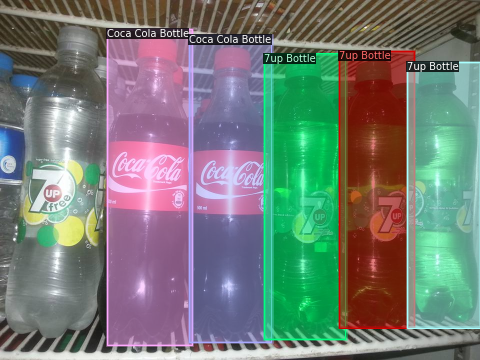

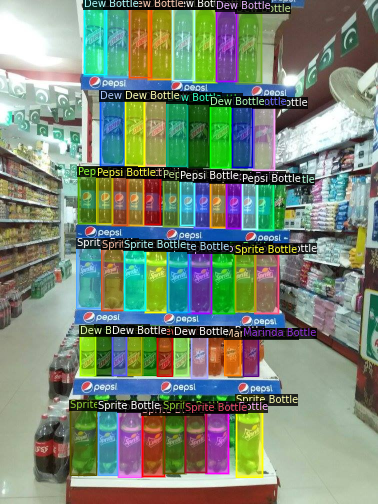

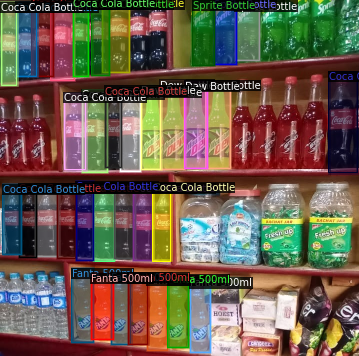

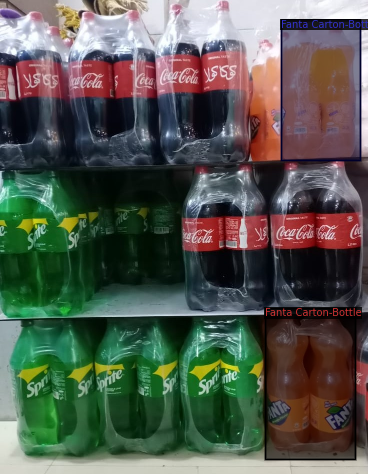

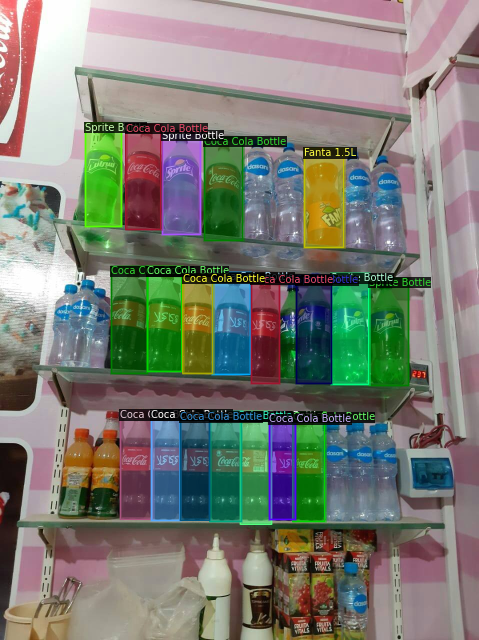

In [16]:
visualize_annotated_imgs(dataset_dict=fanta_dict,num_samples=5,metadata=fanta_metadata) #using custom function 

### **Training The Model**
This is the core part of modeling. Let's train our model using pre defined custom function and setting up right parameters. 
This step is very experimenting. 
Set different parameters and observe the results.  After a long duration of experiments and studies I have choosen some best parameters and a good model to train.

**Note :** If we have already trained the model then we can skip this step and move to next step for loading trained model. (One of my trained model can be found in dataset directory and can be loaded).

In [17]:
#@title ## Select Model and weights
model_path = '/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml' #@param ["/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_DC5_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_C4_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_1x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x_giou.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml","/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"]
model_weights="detectron2://ImageNetPretrained/MSRA/R-101.pkl" #@param {type:"string"}

In [18]:
#@title ## Set Hyper Parameters
num_classes =  11#@param {type:"number"}
lr = 0.0125 #@param {type:"number"}
iters = 6000 #@param {type:"slider", min:100, max:10000, step:100}

In [62]:
#training
trainer=train_model(model_path=model_path,train_data="fanta",
                    num_classes=num_classes,
                    model_weights=model_weights,
                    lr=lr,
                    iters=iters)

[09/24 07:50:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

KeyboardInterrupt: ignored

#### Visualising Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

### **Evaluating The Model**
There are some ways to evaluate the detectron2 trained model. For now we will use `coco evaluation` report and lets see how accurate our model is.
We are going to use our pre defined `coco_evaluator` function in this part. 

#### Registering validation data
For Coco evaluation it is compulsory that our train and val set should be annotated and in coco format. So, lets register it now.

In [ ]:
annotations="/content/drive/My Drive/Bevarages_Dset/annotations/validation.json"
imgs_dir='/content/drive/My Drive/Bevarages_Dset/val'
fanta_val_metadata,fanta_val_dict=register_dataset("fanta_val",annotations,imgs_dir)

WARNING [09/23 18:37:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 18:37:39 d2.data.datasets.coco]: Loaded 15 images in COCO format from /content/drive/My Drive/Bevarages_Dset/annotations/validation.json


In [ ]:
coco_evaluator("fanta_val",trainer)

WARNING [09/23 18:37:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 18:37:45 d2.data.datasets.coco]: Loaded 15 images in COCO format from /content/drive/My Drive/Bevarages_Dset/annotations/validation.json
[09/23 18:37:45 d2.data.build]: Distribution of instances among all 11 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  Fanta 500ml  | 32           |  Fanta 1.5L   | 12           |   Fanta Can   | 6            |
| Coca Cola B.. | 115          | Pepsi Bottle  | 36           | Sprite Bottle | 34           |
| Fanta Carto.. | 3            | Fanta Carto.. | 8            |  Dew Bottle   | 54           |
|  7up Bottle   | 32           | Marinda Bot.. | 34           |               |              |
|     total     | 366          |               |              |  

### **Loading Trained Model**
Since we have trained our model so now its the time to load it as a predictor and use to make predictions on images.
Simply, give the model path (that is the actual backend model on which model was trained) and its related weights (that can be found into *content -> detectron2_repo -> configs* Folder in workplace or use path of saved model).

In [20]:
model_path="/content/detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml"
weights="/content/drive/My Drive/Bevarages_Dset/trained_models/fanta_trained_mask_rcnn_101.pth"
predictor=load_trained_model(model_path,weights,num_classes=11,threshold=0.85)

### **Making Predictions on Reall World Images**
The reall results are those who are obtained from reall world images. So, here we will use some reall world images which are unannotated, totaly unseen by model and will see that how much acurate our model is predicting the allocated products on which it was trained.

We are going to use our pre defined function for visualising the predictions.

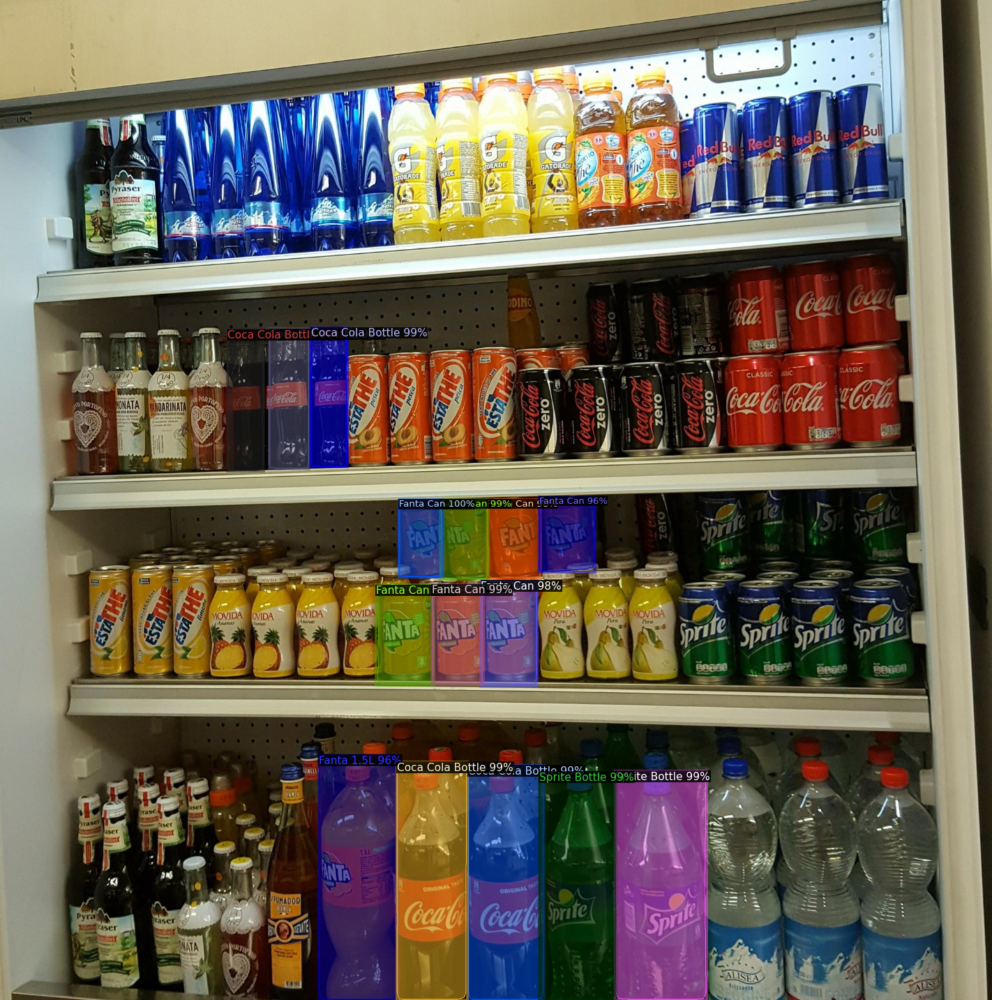

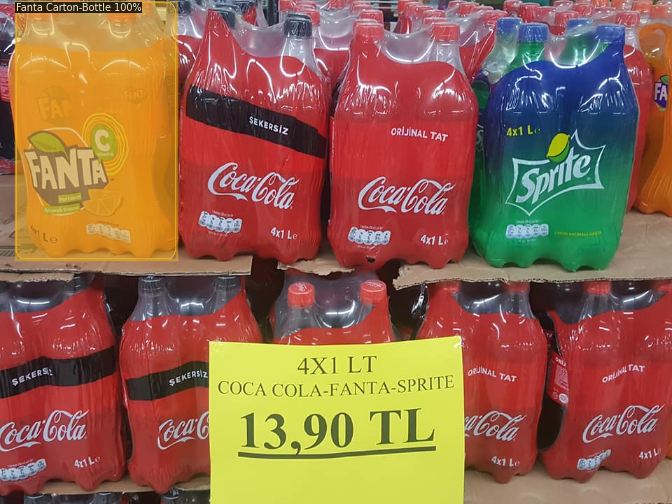

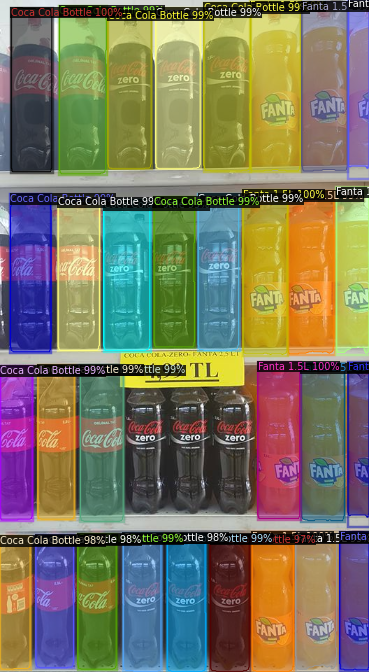

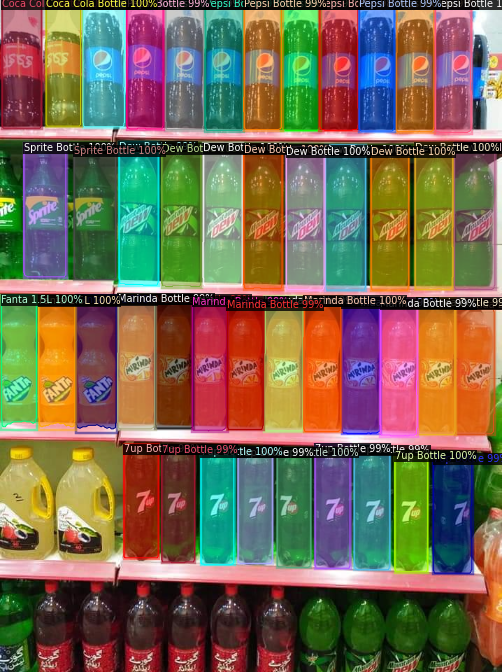

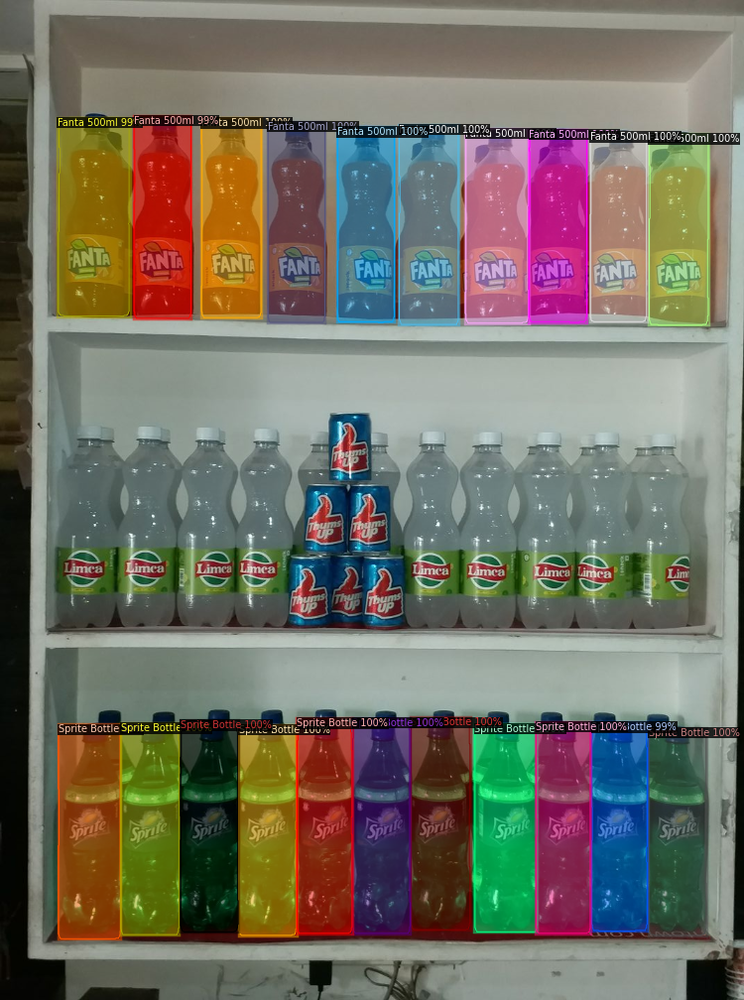

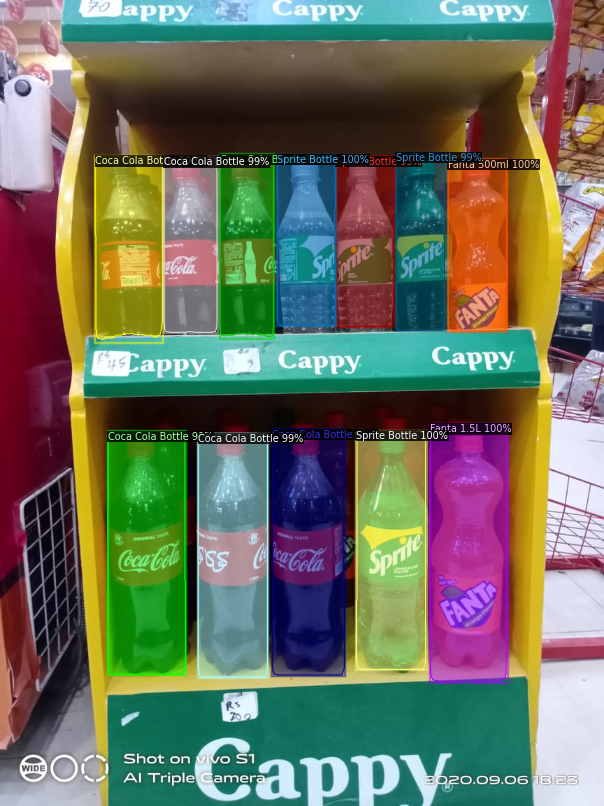

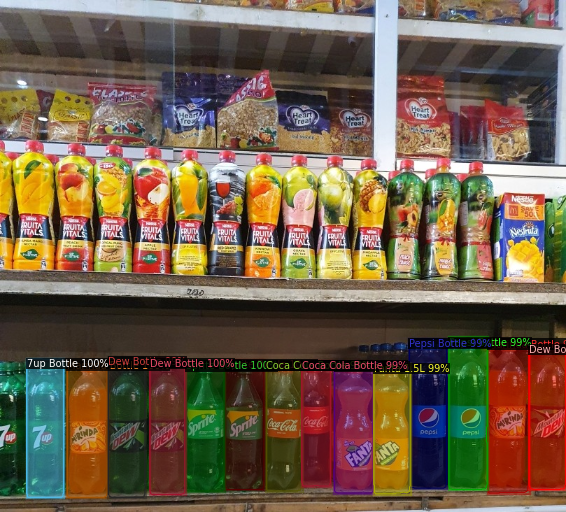

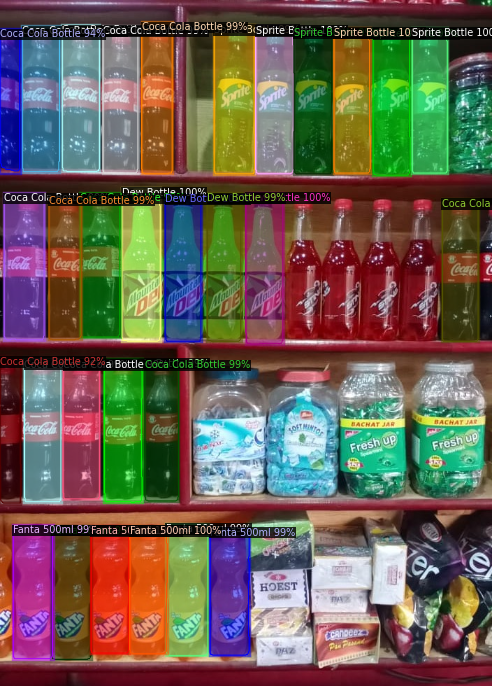

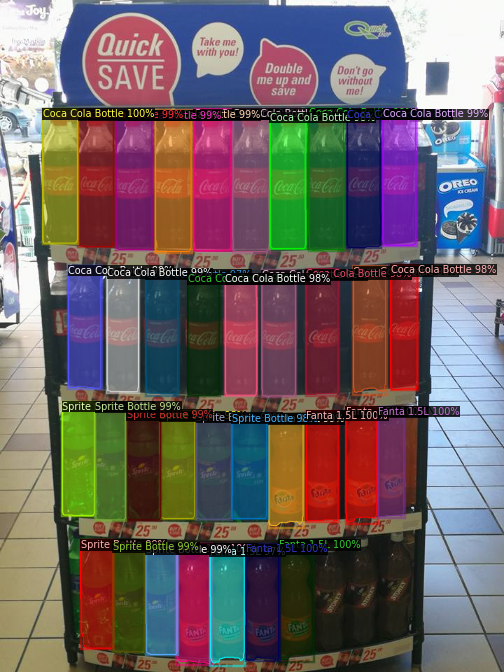

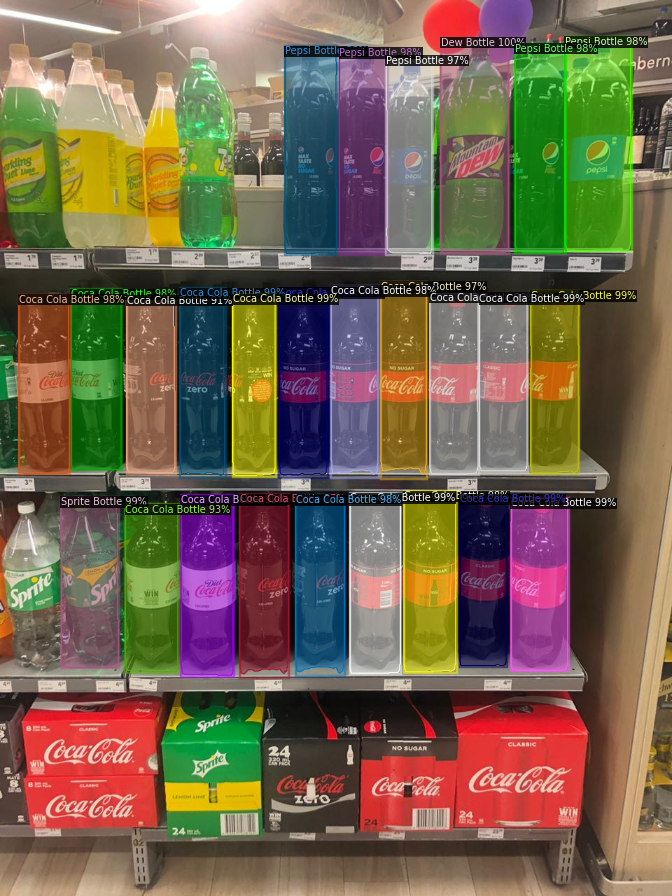

In [28]:
imgs_dir="/content/drive/My Drive/Bevarages_Dset/test"
visualize_predictions(predictor=predictor,imgs_path=imgs_dir,metadata=fanta_metadata,num_imgs=10)

### **Getting the Predicted Instances in CSV Format**
In this cell we are going to use our custom function which we have defined in the starting (in custom functions sections) to get the predicted instaces in images in CSV format which is the requirement for submission of project. Also doing this is an industory standard so that these prediction results can be reused of can be checked.

In [61]:
imgs_path="/content/drive/My Drive/Bevarages_Dset/test"
df=get_predictions_dataframe(imgs_path=imgs_path,predictor=predictor,metadata=fanta_metadata,num_imgs=10)
df.head()

,Img_path,Height,Width,X1,Y1,X2,Y2,Predicted Class,Confidence Level
0,test_img1.jpg,2048,2032,816,1024,906,1182,Fanta Can,0.995677
1,test_img1.jpg,2048,2032,1260,1579,1447,2048,Sprite Bottle,0.994336
2,test_img1.jpg,2048,2032,812,1561,956,2048,Coca Cola Bottle,0.993614
3,test_img1.jpg,2048,2032,958,1568,1114,2048,Coca Cola Bottle,0.992804
4,test_img1.jpg,2048,2032,1104,1581,1261,2048,Sprite Bottle,0.991084


In [63]:
df.to_csv("predictions.csv")

In [52]:
df

,Img_path,Height,Width,X1,Y1,X2,Y2,Predicted Class,Confidence Level
0,17990364_420565164988499_1439141938307963412_o...,2048,2032,816,1024,906,1182,Fanta Can,0.995677
1,17990364_420565164988499_1439141938307963412_o...,2048,2032,1260,1579,1447,2048,Sprite Bottle,0.994336
2,17990364_420565164988499_1439141938307963412_o...,2048,2032,812,1561,956,2048,Coca Cola Bottle,0.993614
3,17990364_420565164988499_1439141938307963412_o...,2048,2032,958,1568,1114,2048,Coca Cola Bottle,0.992804
4,17990364_420565164988499_1439141938307963412_o...,2048,2032,1104,1581,1261,2048,Sprite Bottle,0.991084
...,...,...,...,...,...,...,...,...,...
226,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,551,80,618,364,Pepsi Bottle,0.974953
227,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,543,403,610,685,Coca Cola Bottle,0.974032
228,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,342,706,413,968,Coca Cola Bottle,0.971856
229,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,179,721,255,961,Coca Cola Bottle,0.930559


In [38]:
df

,Img_path,Height,Width,X1,Y1,X2,Y2,Predicted Class,Confidence Level
0,17990364_420565164988499_1439141938307963412_o...,2048,2032,816,1024,906,1182,Fanta Can,0.995677
1,17990364_420565164988499_1439141938307963412_o...,2048,2032,1260,1579,1447,2048,Sprite Bottle,0.994336
2,17990364_420565164988499_1439141938307963412_o...,2048,2032,812,1561,956,2048,Coca Cola Bottle,0.993614
3,17990364_420565164988499_1439141938307963412_o...,2048,2032,958,1568,1114,2048,Coca Cola Bottle,0.992804
4,17990364_420565164988499_1439141938307963412_o...,2048,2032,1104,1581,1261,2048,Sprite Bottle,0.991084
...,...,...,...,...,...,...,...,...,...
226,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,551,80,618,364,Pepsi Bottle,0.974953
227,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,543,403,610,685,Coca Cola Bottle,0.974032
228,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,342,706,413,968,Coca Cola Bottle,0.971856
229,WhatsApp Image 2020-09-12 at 12.32.58 PM (1).jpeg,1280,960,179,721,255,961,Coca Cola Bottle,0.930559


In [ ]:
imgs_path="/content/drive/My Drive/Bevarages_Dset/test"
lis=[]
for img in os.listdir(imgs_path)[:4]:
    im=cv2.imread(os.path.join(imgs_path,img))
    outputs=predictor(im)
    boxe = [i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_boxes]
    classe=[i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_classes]
    scores =[i.cpu().detach().numpy().astype('float32').tolist() for i in outputs["instances"].scores]
    height=outputs["instances"].image_size[0]
    width=outputs["instances"].image_size[1]
    name=img
    for i in range(len(boxe)):
      boxes = boxe[i]
      x1=boxes[0]
      y1=boxes[1]
      x2=boxes[2]
      y2=boxes[3]
      score=scores[i]
      classes=classe[i]
      pred_class=fanta_metadata.thing_classes[classes]
      lis.append({"img_name":name,"height":height,"width":width,"x1":x1,"y1":y1,"x2":x2,"y2":y2,"Predicted_class":(classes,pred_class),"scores":score})

In [ ]:
liss=[]
im=cv2.imread("img.jpg")
outputs=predictor(im)
boxe = [i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_boxes]
classe=[i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_classes]
scores =[i.cpu().detach().numpy().astype('float32').tolist() for i in outputs["instances"].scores]
height=outputs["instances"].image_size[0]
width=outputs["instances"].image_size[1]
name=img
for i in range(len(boxe)):
  boxes = boxe[i]
  x1=boxes[0]
  y1=boxes[1]
  x2=boxes[2]
  y2=boxes[3]
  score=scores[i]
  classes=classe[i]
  pred_class=fanta_metadata.thing_classes[classes]
  liss.append({"img_name":name,"height":height,"width":width,"x1":x1,"y1":y1,"x2":x2,"y2":y2,"Predicted_class":(classes,pred_class),"scores":score})

In [ ]:
df=pd.DataFrame(liss)

In [ ]:
fanta_metadata.thing_classes

['Fanta 500ml',
 'Fanta 1.5L',
 'Fanta Can',
 'Coca Cola Bottle',
 'Pepsi Bottle',
 'Sprite Bottle',
 'Fanta Carton-Bottle',
 'Fanta Carton-Can',
 'Dew Bottle',
 '7up Bottle',
 'Marinda Bottle']

In [ ]:
outputs["instances"]

Instances(num_instances=5, image_height=900, image_width=1200, fields=[pred_boxes: Boxes(tensor([[ 31.2996, 231.0760, 205.6417, 786.1302],
        [798.7224, 236.0961, 968.7001, 785.5858],
        [612.0472, 233.0659, 769.6282, 804.6481],
        [239.8483, 244.5949, 387.8614, 787.8682],
        [423.6088, 217.6485, 590.3137, 806.2941]], device='cuda:0')), scores: tensor([0.9963, 0.9941, 0.9923, 0.9923, 0.9903], device='cuda:0'), pred_classes: tensor([5, 3, 3, 1, 1], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [

In [ ]:
df

,img_name,height,width,x1,y1,x2,y2,Predicted_class,scores
0,92867755_941882086228498_7510451461877137408_n...,900,1200,31,231,205,786,"(5, Sprite Bottle)",1.00
1,92867755_941882086228498_7510451461877137408_n...,900,1200,798,236,968,785,"(3, Coca Cola Bottle)",0.99
2,92867755_941882086228498_7510451461877137408_n...,900,1200,612,233,769,804,"(3, Coca Cola Bottle)",0.99
3,92867755_941882086228498_7510451461877137408_n...,900,1200,239,244,387,787,"(1, Fanta 1.5L)",0.99
4,92867755_941882086228498_7510451461877137408_n...,900,1200,423,217,590,806,"(1, Fanta 1.5L)",0.99


In [ ]:
boxe = [i.cpu().detach().numpy().astype('int').tolist() for i in outputs["instances"].pred_boxes]

In [ ]:
len(boxe)

15